In [70]:
#pip install monai nibabel


In [4]:
import nibabel as nib
#from monai.transforms import Compose, LoadImaged, AddChanneld, ToTensord
from monai.inferers import sliding_window_inference
from monai.networks.nets import UNet
from monai.data import Dataset, DataLoader
import torch

Unique label values: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17.
 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 32. 33. 34. 35. 36.
 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50. 51. 52. 53. 54.
 55. 56. 57. 58. 59. 60. 61. 62. 63. 64. 65. 66. 67. 68. 69. 70. 71. 72.
 73. 74. 75. 76. 77. 78. 79. 80. 81. 82. 83. 84. 85. 86. 87. 88. 89. 90.
 91. 92. 93. 94. 95. 96.]


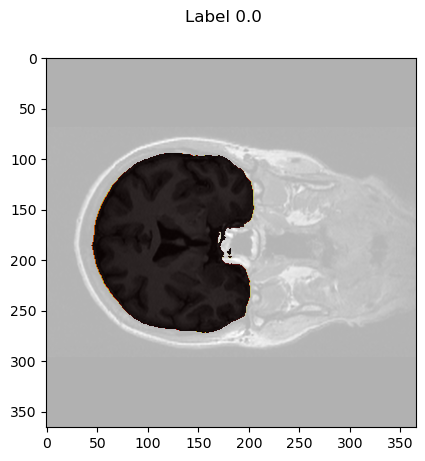

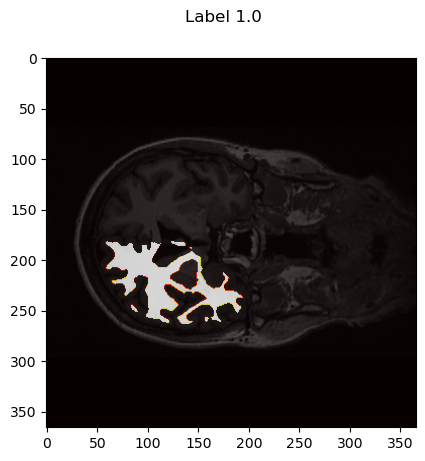

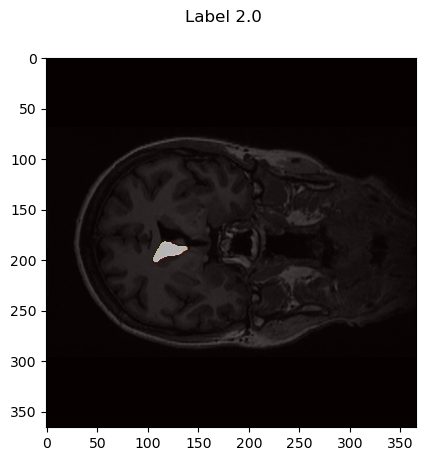

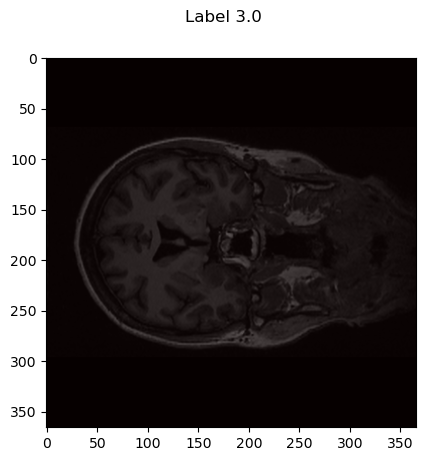

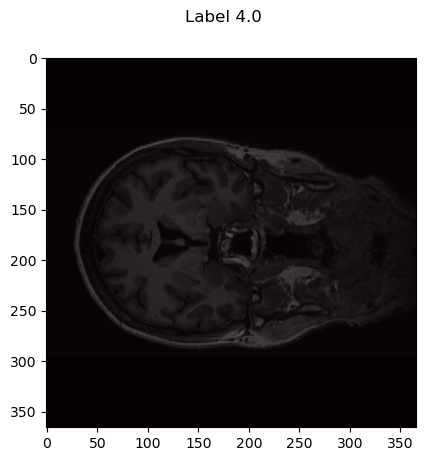

...

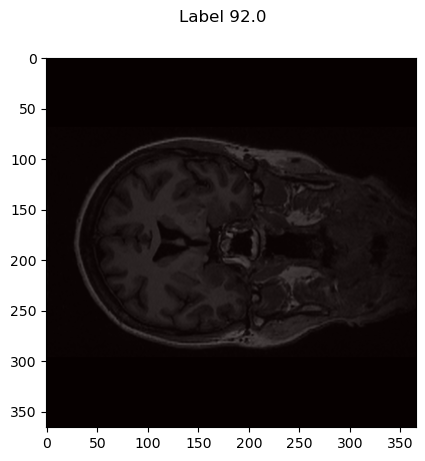

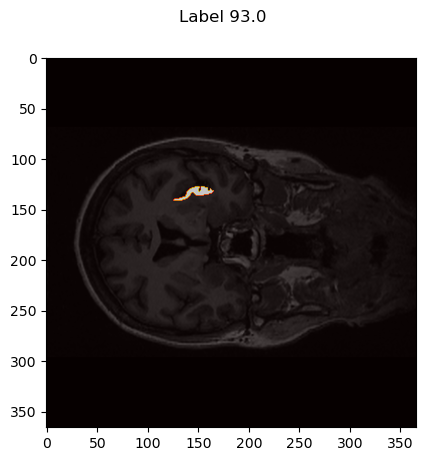

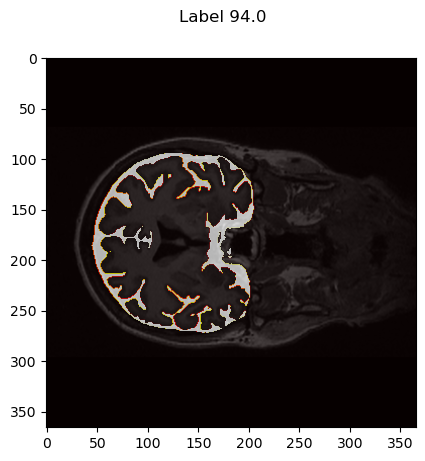

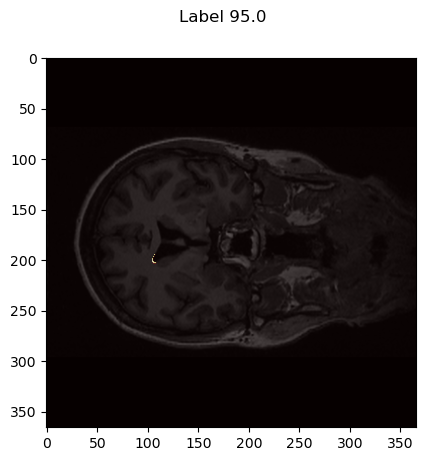

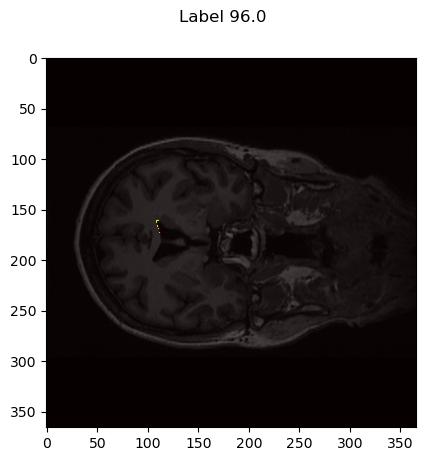

In [57]:
# 유니크
unique_labels = np.unique(label_data)
print("Unique label values:", unique_labels)


for label in unique_labels:
    mask = label_data == label
    if np.any(mask):
        plt.figure()
        plt.suptitle(f"Label {label}")
        plt.imshow(image_data[:, :, image_data.shape[2] // 2], cmap='gray')
        plt.imshow(mask[:, :, mask.shape[2] // 2], cmap='hot', alpha=0.7)
        plt.show()


In [114]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt


image_path = 'conform_input.nii.gz'
label_path = 'dnn_label.nii.gz'

image_nii = nib.load(image_path)
label_nii = nib.load(label_path)


image_data = image_nii.get_fdata()
label_data = label_nii.get_fdata()


hippocampus_labels = [14, 28]


In [115]:


# right , left  합치기 
hippocampus_data = np.isin(label_data, hippocampus_labels).astype(np.float32)




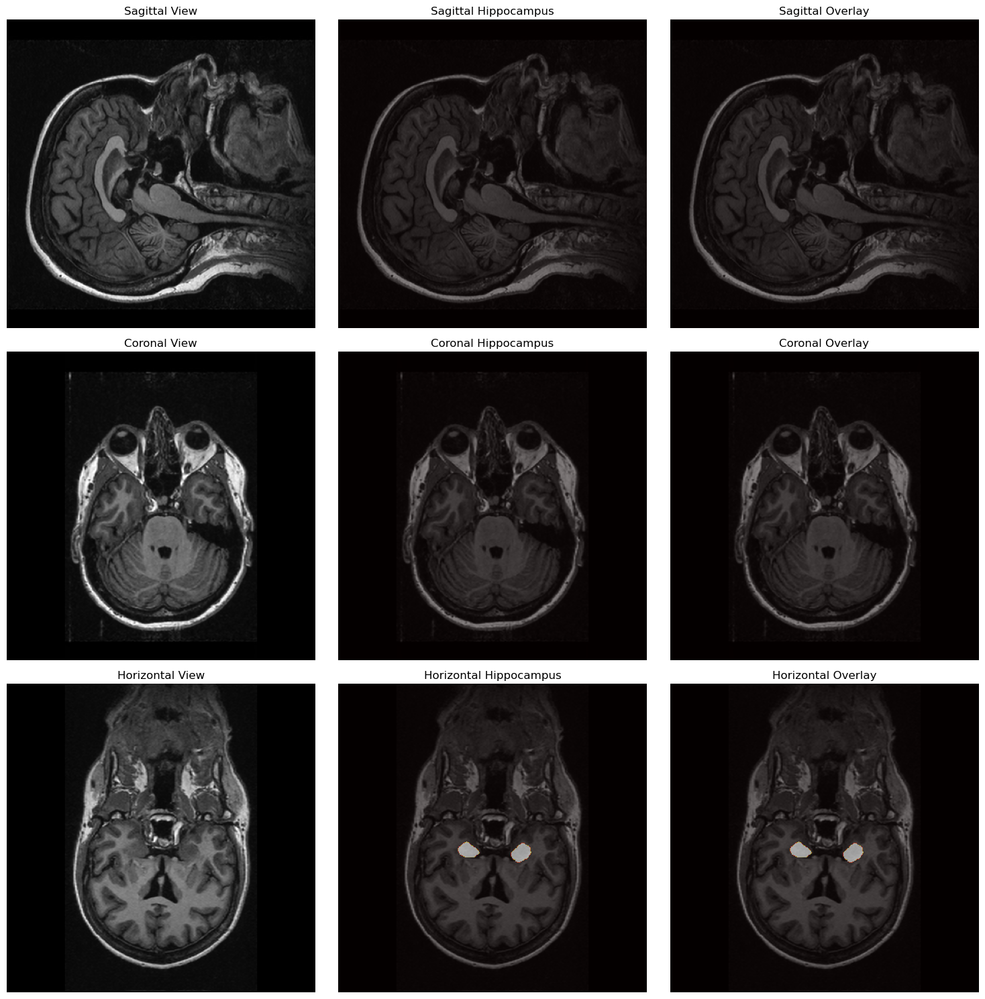

In [119]:

sagittal_slice_idx = image_data.shape[0] // 2 # 축방향대로 !, 반으로
coronal_slice_idx = image_data.shape[1] // 2
horizontal_slice_idx = image_data.shape[2] // 2


sagittal_image_slice = image_data[sagittal_slice_idx, :, :]
coronal_image_slice = image_data[:, coronal_slice_idx, :]
horizontal_image_slice = image_data[:, :, horizontal_slice_idx]

sagittal_hippocampus_slice = hippocampus_data[sagittal_slice_idx, :, :]
coronal_hippocampus_slice = hippocampus_data[:, coronal_slice_idx, :]
horizontal_hippocampus_slice = hippocampus_data[:, :, horizontal_slice_idx]

# 시각화
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

# Sagittal 방향 시각화
axes[0, 0].imshow(sagittal_image_slice.T, cmap='gray', origin='lower')
axes[0, 0].set_title('Sagittal View')
axes[0, 0].axis('off')

axes[0, 1].imshow(sagittal_image_slice.T, cmap='gray', origin='lower')
axes[0, 1].imshow(sagittal_hippocampus_slice.T, cmap='hot', alpha=0.5, origin='lower')
axes[0, 1].set_title('Sagittal Hippocampus')
axes[0, 1].axis('off')

axes[0, 2].imshow(sagittal_image_slice.T, cmap='gray', origin='lower')
axes[0, 2].imshow(sagittal_hippocampus_slice.T, cmap='hot', alpha=0.5, origin='lower')
axes[0, 2].set_title('Sagittal Overlay')
axes[0, 2].axis('off')

# Coronal 방향 시각화
axes[1, 0].imshow(coronal_image_slice.T, cmap='gray', origin='lower')
axes[1, 0].set_title('Coronal View')
axes[1, 0].axis('off')

axes[1, 1].imshow(coronal_image_slice.T, cmap='gray', origin='lower')
axes[1, 1].imshow(coronal_hippocampus_slice.T, cmap='hot', alpha=0.5, origin='lower')
axes[1, 1].set_title('Coronal Hippocampus')
axes[1, 1].axis('off')

axes[1, 2].imshow(coronal_image_slice.T, cmap='gray', origin='lower')
axes[1, 2].imshow(coronal_hippocampus_slice.T, cmap='hot', alpha=0.5, origin='lower')
axes[1, 2].set_title('Coronal Overlay')
axes[1, 2].axis('off')

# Horizontal 방향 시각화
axes[2, 0].imshow(horizontal_image_slice.T, cmap='gray', origin='lower')
axes[2, 0].set_title('Horizontal View')
axes[2, 0].axis('off')

axes[2, 1].imshow(horizontal_image_slice.T, cmap='gray', origin='lower')
axes[2, 1].imshow(horizontal_hippocampus_slice.T, cmap='hot', alpha=0.5, origin='lower')
axes[2, 1].set_title('Horizontal Hippocampus')
axes[2, 1].axis('off')

axes[2, 2].imshow(horizontal_image_slice.T, cmap='gray', origin='lower')
axes[2, 2].imshow(horizontal_hippocampus_slice.T, cmap='hot', alpha=0.5, origin='lower')
axes[2, 2].set_title('Horizontal Overlay')
axes[2, 2].axis('off')

plt.tight_layout()
plt.show()


In [102]:
#pip install --upgrade monai


In [84]:
from monai.config import print_config
from monai.transforms import (
    Compose,
    LoadImaged,
    #AddChanneld,
    ScaleIntensityd,
    ToTensord,
    Resized
)
from monai.visualize import matshow3d

import matplotlib.pyplot as plt
import numpy as np

In [99]:
import numpy as np
import nibabel as nib
#from monai.data import write_nifti
from monai.transforms import Compose, LoadImaged ,ToTensord
from monai.utils import first


image_path = 'conform_input.nii.gz'
label_path = 'dnn_label.nii.gz'

image_nii = nib.load(image_path)
label_nii = nib.load(label_path)


image_data = image_nii.get_fdata()
label_data = label_nii.get_fdata()


hippocampus_labels = [14, 28]



hippocampus_mask = np.isin(label_data, hippocampus_labels).astype(np.float32)


hippocampus_mask_nii = nib.Nifti1Image(hippocampus_mask, affine=label_nii.affine)
nib.save(hippocampus_mask_nii, 'hippocampus_mask.nii.gz')




data_dicts = [{'image': image_path, 'label': 'hippocampus_mask.nii.gz'}]

# MONAI의 Compose를 사용해 transforms 파이프라인을 정의합니다.
transforms = Compose([
    LoadImaged(keys=['image', 'label']),
    #AddChanneld(keys=['image', 'label']),
    ToTensord(keys=['image', 'label'])
])


transformed_data = first(transforms(data_dicts))

In [100]:

image_tensor = transformed_data['image']
label_tensor = transformed_data['label']

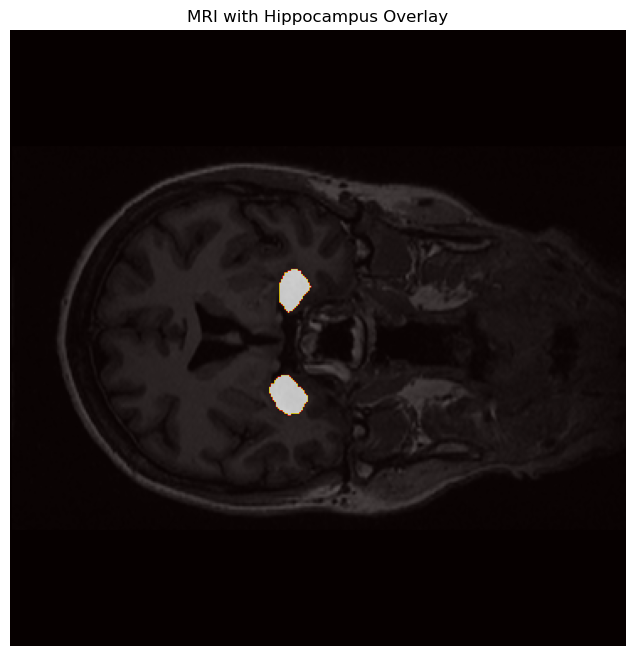

In [109]:
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt


image_nii = nib.load('conform_input.nii.gz')
label_nii = nib.load('dnn_label.nii.gz')


image_data = np.array(image_nii.dataobj)
label_data = np.array(label_nii.dataobj)


hippocampus_labels = [14, 28]  # Replace with the correct label indices
hippocampus_mask = np.isin(label_data, hippocampus_labels)


image_data = image_data[None, :, :, :] if image_data.ndim == 3 else image_data
hippocampus_mask = hippocampus_mask[None, :, :, :] if hippocampus_mask.ndim == 3 else hippocampus_mask


slice_index = image_data.shape[2] // 2  # Middle slice
image_slice = image_data[0, :, :, slice_index]
mask_slice = hippocampus_mask[0, :, :, slice_index]


plt.figure(figsize=(10, 8))
plt.imshow(image_slice, cmap='gray')  # Display the image slice
plt.imshow(mask_slice, cmap='hot', alpha=0.7)  # Overlay the hippocampus mask with transparency
plt.title("MRI with Hippocampus Overlay")
plt.axis("off")
plt.show()


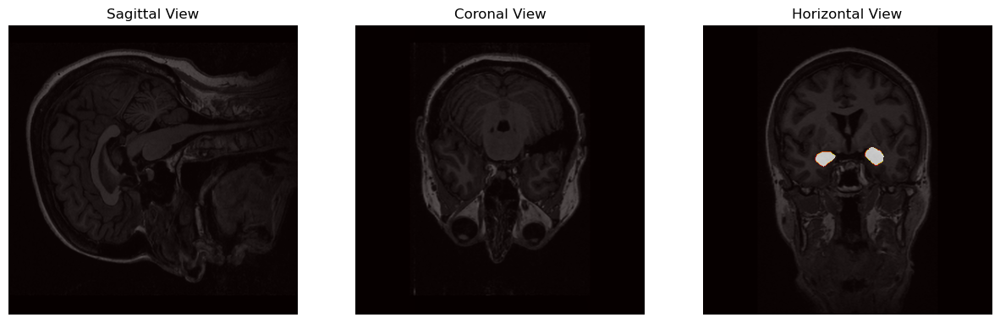

In [110]:
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt

# Load the images using Nibabel
image_nii = nib.load('conform_input.nii.gz')
label_nii = nib.load('dnn_label.nii.gz')

# Convert the Nibabel images to NumPy arrays
image_data = np.array(image_nii.dataobj)
label_data = np.array(label_nii.dataobj)

# Find the hippocampus labels in the label data
hippocampus_labels = [14, 28]  # Replace with the correct label indices
hippocampus_mask = np.isin(label_data, hippocampus_labels)

# Ensure there's a single channel dimension for both arrays
image_data = image_data[None, :, :, :] if image_data.ndim == 3 else image_data
hippocampus_mask = hippocampus_mask[None, :, :, :] if hippocampus_mask.ndim == 3 else hippocampus_mask

# Select slices to visualize: sagittal, coronal, and horizontal
sagittal_index = image_data.shape[1] // 2
coronal_index = image_data.shape[2] // 2
horizontal_index = image_data.shape[3] // 2

sagittal_image_slice = image_data[0, sagittal_index, :, :]
sagittal_mask_slice = hippocampus_mask[0, sagittal_index, :, :]

coronal_image_slice = image_data[0, :, coronal_index, :]
coronal_mask_slice = hippocampus_mask[0, :, coronal_index, :]

horizontal_image_slice = image_data[0, :, :, horizontal_index]
horizontal_mask_slice = hippocampus_mask[0, :, :, horizontal_index]

# Create a plot to display the images and overlays
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Sagittal view
axes[0].imshow(sagittal_image_slice.T, cmap='gray')  # Display the image slice
axes[0].imshow(sagittal_mask_slice.T, cmap='hot', alpha=0.7)  # Overlay the hippocampus mask with transparency
axes[0].set_title("Sagittal View")
axes[0].axis("off")

# Coronal view
axes[1].imshow(coronal_image_slice.T, cmap='gray')  # Display the image slice
axes[1].imshow(coronal_mask_slice.T, cmap='hot', alpha=0.7)  # Overlay the hippocampus mask with transparency
axes[1].set_title("Coronal View")
axes[1].axis("off")

# Horizontal view
axes[2].imshow(horizontal_image_slice.T, cmap='gray')  # Display the image slice
axes[2].imshow(horizontal_mask_slice.T, cmap='hot', alpha=0.7)  # Overlay the hippocampus mask with transparency
axes[2].set_title("Horizontal View")
axes[2].axis("off")

plt.show()
